<a href="https://colab.research.google.com/github/ingkapat/Thai-Scam-Call-Detector/blob/main/baseline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q transformers torchaudio librosa soundfile scikit-learn seaborn openai
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os, json, time, re, warnings
import numpy as np, pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
from tqdm.auto import tqdm
from sklearn.metrics import (f1_score, accuracy_score, recall_score,
                              precision_score, confusion_matrix)
import torch, librosa

warnings.filterwarnings('ignore'); sns.set_theme(style='whitegrid')
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)

DRIVE_BASE     = '/content/drive/MyDrive/ThaiScamCall'
REAL_AUDIO_DIR = f'{DRIVE_BASE}/real_audio'
TEXT_CLEAN     = f'{DRIVE_BASE}/models/phayathai_scam_v2'   # two-stage text classifier (trained)
OUT_DIR        = f'{DRIVE_BASE}/runs/baselines'
os.makedirs(OUT_DIR, exist_ok=True)

CLASS_NAMES = ['not_scam', 'scam']
SR = 16000
CHUNK_SEC = 5
MAX_CONTEXT_SEC = 15      # sliding: 0-5, 0-10, 0-15, 5-20, ...
SCAM_THRESHOLD = 0.5      # prob > นี่ = window flag scam

Device: cuda


In [3]:
# Metadata จากชื่อไฟล์
audio_files = sorted([f for f in os.listdir(REAL_AUDIO_DIR)
                      if f.lower().endswith(('.mp3', '.wav', '.m4a'))])
def detect_label(fn):
    f = fn.lower()
    if 'notscam' in f or 'not_scam' in f: return 0
    if 'scam' in f: return 1
    return None
meta = pd.DataFrame([{'filename': f, 'label': detect_label(f)} for f in audio_files])
meta = meta[meta.label.notna()].reset_index(drop=True)
meta['label'] = meta.label.astype(int)
meta['duration'] = [librosa.get_duration(path=f'{REAL_AUDIO_DIR}/{f}') for f in meta.filename]
meta = meta[meta.duration >= CHUNK_SEC].reset_index(drop=True)
print(f'{len(meta)} files | {meta.label.value_counts().to_dict()}')
print(meta.to_string(index=False))

19 files | {1: 12, 0: 7}
        filename  label   duration
rw_notscam01.mp3      0  42.253084
rw_notscam02.mp3      0  72.443583
rw_notscam03.mp3      0  30.375692
rw_notscam04.mp3      0  75.190590
rw_notscam05.mp3      0  46.308118
rw_notscam06.mp3      0  57.897732
rw_notscam07.mp3      0 111.686009
   rw_scam01.mp3      1 110.718027
   rw_scam02.mp3      1 636.244875
   rw_scam03.mp3      1 210.222381
   rw_scam04.mp3      1  76.089229
   rw_scam05.mp3      1  19.858730
   rw_scam06.mp3      1  60.000363
   rw_scam07.mp3      1 162.884308
   rw_scam08.mp3      1 130.627052
   rw_scam09.mp3      1 145.408345
   rw_scam10.mp3      1 120.868776
   rw_scam11.mp3      1  81.076939
   rw_scam12.mp3      1 111.555193


In [6]:
from transformers import (AutoProcessor, AutoModelForSpeechSeq2Seq,
                          AutoTokenizer, AutoModelForSequenceClassification)

# ASR (Thonburian Whisper) — ใช้กับ two-stage/keyword เท่านั้น (LLM ฟังเสียงเอง)
asr_processor = AutoProcessor.from_pretrained('biodatlab/whisper-th-medium-combined')
asr_model = AutoModelForSpeechSeq2Seq.from_pretrained(
    'biodatlab/whisper-th-medium-combined',
    torch_dtype=torch.float16 if device=='cuda' else torch.float32).to(device).eval()
asr_forced = asr_processor.get_decoder_prompt_ids(language='th', task='transcribe')

# Two-stage text classifier (BERT ที่ fine-tune แล้ว)
text_tok = AutoTokenizer.from_pretrained(TEXT_CLEAN)
text_model = AutoModelForSequenceClassification.from_pretrained(TEXT_CLEAN).to(device).eval()

# LLM zero-shot ผ่าน OpenRouter (multimodal — รับ audio เข้าตรงๆ)
from openai import OpenAI
from google.colab import userdata
# 🔧 ต้องเป็นโมเดลที่รับ audio input ได้:
#   - 'openai/gpt-4o-audio-preview'
#   - 'openai/gpt-4o-mini-audio-preview'   ← cheap default
#   - 'google/gemini-2.5-flash'
#   - 'google/gemini-2.0-flash-001'
OPENROUTER_MODEL = 'openai/gpt-4o-mini-audio-preview'
gpt = OpenAI(
    api_key=userdata.get('OPENROUTER_KEY'),
    base_url='https://openrouter.ai/api/v1',
)

print(f'✅ loaded — LLM (audio-in): {OPENROUTER_MODEL}')

Loading weights:   0%|          | 0/948 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

✅ loaded — LLM (audio-in): openai/gpt-4o-mini-audio-preview


In [7]:
# === Classifiers (คืน prob_scam 0.0-1.0) ===
import base64

@torch.no_grad()
def asr_transcribe(chunk):
    inp = asr_processor(chunk, sampling_rate=SR, return_tensors='pt')
    inp = {k:(v.to(device, dtype=asr_model.dtype if v.dtype==torch.float32 else v.dtype))
           for k,v in inp.items()}
    g = asr_model.generate(**inp, forced_decoder_ids=asr_forced, max_new_tokens=128)
    return asr_processor.batch_decode(g, skip_special_tokens=True)[0]

# Two-stage: BERT ที่ fine-tune scam
@torch.no_grad()
def bert_prob(text):
    enc = text_tok(text, truncation=True, max_length=256, return_tensors='pt').to(device)
    return float(torch.softmax(text_model(**enc).logits, -1).cpu().numpy()[0][1])

# Word-count baseline
SCAM_KW = ['โอนเงิน','โอน','ค่าธรรมเนียม','ค่าปรับ','ค้างชำระ','ภาษี','OTP','รหัส',
    'บัญชี','อายัด','ระงับ','หมายจับ','ตำรวจ','คดี','ฟอกเงิน','ดำเนินคดี','ติดคุก',
    'ปอท','พัสดุ','ศุลกากร','ตกค้าง','ขนส่ง','ด่วน','ภายใน','ชั่วโมง','รีบ','รางวัล',
    'โชคดี','กำไร','การันตี','ลงทุน','กด 9','กด 1','แอดไลน์','ห้ามบอก','ความลับ']
def keyword_prob(text):
    return 1.0 if any(k in text for k in SCAM_KW) else 0.0

# === LLM zero-shot: ส่งไฟล์ mp3 ดิบทั้งไฟล์ → ทำนาย 1 ครั้ง ===
ZERO_SHOT_SYSTEM = (
    'คุณเป็นระบบตรวจ scam call ไทยแบบ zero-shot '
    'ฟังบทสนทนาแล้วประเมินความน่าจะเป็นที่จะเป็น scam call '
    'ตอบเป็นตัวเลข 0-100 เท่านั้น (0=ปกติแน่นอน, 100=scam แน่นอน) ห้ามอธิบาย'
)

def llm_audio_prob_path(audio_path):
    """อ่าน mp3 file ดิบ → base64 → ส่ง LLM ตรงๆ ไม่ decode."""
    ext = os.path.splitext(audio_path)[1].lower().lstrip('.')
    fmt = 'mp3' if ext == 'mp3' else ('wav' if ext == 'wav' else ext)
    with open(audio_path, 'rb') as f:
        b64 = base64.b64encode(f.read()).decode('utf-8')
    try:
        r = gpt.chat.completions.create(
            model=OPENROUTER_MODEL,
            modalities=['text'],
            messages=[
                {'role':'system','content': ZERO_SHOT_SYSTEM},
                {'role':'user','content':[
                    {'type':'text','text':'ฟังคลิปนี้ ความน่าจะเป็น scam (0-100):'},
                    {'type':'input_audio','input_audio':{'data': b64, 'format': fmt}},
                ]},
            ],
            temperature=0, max_tokens=5,
        )
        num = re.findall(r'\d+', r.choices[0].message.content)
        return float(num[0])/100 if num else 0.0
    except Exception as e:
        print('llm err:', str(e)[:160]); return 0.0

# Quick test (ไฟล์แรก)
_p = f'{REAL_AUDIO_DIR}/{meta.filename.iloc[0]}'
print(f'[{OPENROUTER_MODEL}] test {meta.filename.iloc[0]} → prob =', llm_audio_prob_path(_p))
print('✅ classifiers ready (audio-in LLM mp3 + twostage + keyword)')

llm err: Error code: 400 - {'error': {'message': 'openai/gpt-4o-mini-audio-preview is not a valid model ID', 'code': 400}, 'user_id': 'user_3F5LgAMVOcVhtpETJ2dbhMTM8Vh'}
[openai/gpt-4o-mini-audio-preview] test rw_notscam01.mp3 → prob = 0.0
✅ classifiers ready (audio-in LLM mp3 + twostage + keyword)


In [8]:
# === Runners ===
# (1) Sliding 15s — สำหรับ twostage / keyword (ASR + text classifier)
def run_sliding(audio_path, system, chunk_sec=CHUNK_SEC, max_ctx=MAX_CONTEXT_SEC):
    wav,_ = librosa.load(audio_path, sr=SR); dur = len(wav)/SR
    max_ch = max_ctx // chunk_sec
    hist, rows = [], []
    for i, end in enumerate(np.arange(chunk_sec, dur+0.1, chunk_sec)):
        start = 0 if end <= max_ctx else end - max_ctx
        t0 = time.time()
        new5 = wav[int(end*SR-chunk_sec*SR):int(end*SR)]
        hist.append(asr_transcribe(new5)); hist = hist[-max_ch:]
        txt = ' '.join(hist).strip()
        if   system == 'twostage': prob = bert_prob(txt)
        elif system == 'keyword':  prob = keyword_prob(txt)
        else: raise ValueError(f'sliding ไม่รองรับ {system}')
        rows.append({'round':i+1,'start_sec':float(start),'end_sec':float(end),
                     'prob_scam':float(prob),'pred':int(prob>SCAM_THRESHOLD),
                     'latency':time.time()-t0,'transcript':txt[:200]})
    return pd.DataFrame(rows)

# (2) Full mp3 — สำหรับ LLM: ส่งไฟล์ mp3 ดิบ ทำนายครั้งเดียว
def run_full_llm(audio_path):
    dur = librosa.get_duration(path=audio_path)
    t0 = time.time()
    prob = llm_audio_prob_path(audio_path)
    return pd.DataFrame([{
        'round': 1, 'start_sec': 0.0, 'end_sec': float(dur),
        'prob_scam': float(prob), 'pred': int(prob > SCAM_THRESHOLD),
        'latency': time.time() - t0,
        'transcript': '',
    }])

print('✅ runners ready (sliding for twostage/keyword + full-mp3 for LLM)')

✅ runners ready (sliding for twostage/keyword + full-mp3 for LLM)


In [9]:
# === Run ทั้ง 3 ระบบ ===
# llm      → ส่งไฟล์ mp3 ดิบทั้งไฟล์ ทำนาย 1 ครั้ง (1 row/file)
# twostage → sliding 15s (ASR → BERT)              (หลาย rounds/file)
# keyword  → sliding 15s (ASR → keyword)            (หลาย rounds/file)
SYSTEMS = ['llm', 'twostage', 'keyword']
results = {}
for s in SYSTEMS:
    print(f'\n=== {s} ===')
    rows = []
    for _, m in tqdm(meta.iterrows(), total=len(meta), desc=s):
        path = f'{REAL_AUDIO_DIR}/{m.filename}'
        df = run_full_llm(path) if s == 'llm' else run_sliding(path, s)
        df['filename'] = m.filename; df['true_label'] = m.label
        rows.append(df)
    results[s] = pd.concat(rows, ignore_index=True)
    results[s].to_csv(f'{OUT_DIR}/{s}_rounds.csv', index=False)
    unit = 'sec/file' if s == 'llm' else 'sec/round'
    print(f'  latency mean = {results[s].latency.mean():.2f} {unit}')
print('\n✅ done')


=== llm ===


llm:   0%|          | 0/19 [00:00<?, ?it/s]

llm err: Error code: 400 - {'error': {'message': 'openai/gpt-4o-mini-audio-preview is not a valid model ID', 'code': 400}, 'user_id': 'user_3F5LgAMVOcVhtpETJ2dbhMTM8Vh'}
llm err: Error code: 400 - {'error': {'message': 'openai/gpt-4o-mini-audio-preview is not a valid model ID', 'code': 400}, 'user_id': 'user_3F5LgAMVOcVhtpETJ2dbhMTM8Vh'}
llm err: Error code: 400 - {'error': {'message': 'openai/gpt-4o-mini-audio-preview is not a valid model ID', 'code': 400}, 'user_id': 'user_3F5LgAMVOcVhtpETJ2dbhMTM8Vh'}
llm err: Error code: 400 - {'error': {'message': 'openai/gpt-4o-mini-audio-preview is not a valid model ID', 'code': 400}, 'user_id': 'user_3F5LgAMVOcVhtpETJ2dbhMTM8Vh'}
llm err: Error code: 400 - {'error': {'message': 'openai/gpt-4o-mini-audio-preview is not a valid model ID', 'code': 400}, 'user_id': 'user_3F5LgAMVOcVhtpETJ2dbhMTM8Vh'}
llm err: Error code: 400 - {'error': {'message': 'openai/gpt-4o-mini-audio-preview is not a valid model ID', 'code': 400}, 'user_id': 'user_3F5LgAMVOc

twostage:   0%|          | 0/19 [00:00<?, ?it/s]

[transformers] Using custom `forced_decoder_ids` from the (generation) config. This is deprecated in favor of the `task` and `language` flags/config options.
[transformers] The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] A custom logits processor of type <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> has been passed to `.generate()`, but it was also created in `.generate()`, given its parameterization. The custom <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> will take p

  latency mean = 1.17 sec/round

=== keyword ===


keyword:   0%|          | 0/19 [00:00<?, ?it/s]

[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface

  latency mean = 1.15 sec/round

✅ done


In [10]:
# === Metrics (any aggregation: ถ้ามี window ไหน flag scam → ทั้งไฟล์ = scam) ===
# LLM = 1 row/file → any = ผลตรง
# two-stage / keyword = หลาย rounds → any รวม
rows = []
for s, wdf in results.items():
    calls = [{'true':int(g.true_label.iloc[0]),
              'pred':int((g.prob_scam>SCAM_THRESHOLD).any())} for _,g in wdf.groupby('filename')]
    cdf = pd.DataFrame(calls)
    lat_unit  = 'sec/file' if s == 'llm' else 'sec/round'
    rows.append({
        'system':         s,
        'scam_f1':        f1_score(cdf.true, cdf.pred, pos_label=1, zero_division=0),
        'notscam_f1':     f1_score(cdf.true, cdf.pred, pos_label=0, zero_division=0),
        'macro_f1':       f1_score(cdf.true, cdf.pred, average='macro', zero_division=0),
        'weighted_f1':    f1_score(cdf.true, cdf.pred, average='weighted', zero_division=0),
        'scam_recall':    recall_score(cdf.true, cdf.pred, pos_label=1, zero_division=0),
        'scam_prec':      precision_score(cdf.true, cdf.pred, pos_label=1, zero_division=0),
        'accuracy':       accuracy_score(cdf.true, cdf.pred),
        'latency':        wdf.latency.mean(),
        'latency_unit':   lat_unit,
    })
summary = pd.DataFrame(rows).sort_values('scam_f1', ascending=False).round(4)
summary.to_csv(f'{OUT_DIR}/summary.csv', index=False)
print('=== 3 Systems (any aggregation) ===')
print('llm      = multimodal LLM ฟัง mp3 เต็มไฟล์ (zero-shot, 1 pred/file)')
print('twostage = ASR → BERT fine-tuned (sliding 15s)')
print('keyword  = ASR → keyword match (sliding 15s)\n')
display(summary)

=== 3 Systems (any aggregation) ===
llm      = multimodal LLM ฟัง mp3 เต็มไฟล์ (zero-shot, 1 pred/file)
twostage = ASR → BERT fine-tuned (sliding 15s)
keyword  = ASR → keyword match (sliding 15s)



,system,scam_f1,notscam_f1,macro_f1,weighted_f1,scam_recall,scam_prec,accuracy,latency,latency_unit
1,twostage,0.88,0.7692,0.8246,0.8392,0.9167,0.8462,0.8421,1.1678,sec/round
2,keyword,0.80,0.6154,0.7077,0.7320,0.8333,0.7692,0.7368,1.1545,sec/round
0,llm,0.00,0.5385,0.2692,0.1984,0.0000,0.0000,0.3684,0.2495,sec/file


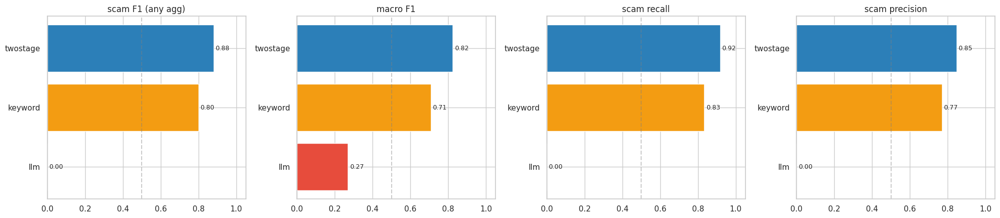


⏱  Latency:
  system  latency latency_unit
twostage   1.1678    sec/round
 keyword   1.1545    sec/round
     llm   0.2495     sec/file


In [11]:
# === Plot: scam_f1 / macro_f1 / scam_recall / scam_prec ===
# (latency อยู่คนละหน่วย — llm=ต่อไฟล์, sliding=ต่อ round — เลยพิมพ์เป็นตารางแยก)
fig, axes = plt.subplots(1, 4, figsize=(20, 4.5))
type_color = {'llm':'#e74c3c','keyword':'#f39c12','twostage':'#2c7fb8'}

panels = [
    ('scam_f1',     'scam F1 (any agg)'),
    ('macro_f1',    'macro F1'),
    ('scam_recall', 'scam recall'),
    ('scam_prec',   'scam precision'),
]
for ax, (col, title) in zip(axes, panels):
    sub = summary.sort_values(col)
    ax.barh(sub.system, sub[col], color=[type_color[s] for s in sub.system])
    ax.set_title(title)
    ax.set_xlim(0, 1.05); ax.axvline(0.5, color='gray', ls='--', alpha=0.4)
    for i, v in enumerate(sub[col]):
        ax.text(v + 0.01, i, f'{v:.2f}', va='center', fontsize=9)

plt.tight_layout()
plt.savefig(f'{OUT_DIR}/baseline_metrics.png', dpi=150, bbox_inches='tight')
plt.show()

print('\n⏱  Latency:')
print(summary[['system','latency','latency_unit']].to_string(index=False))

In [12]:
# ดู prob ของไฟล์ที่ระบบ flag ผิด
import IPython.display as ipd

INSPECT = 'twostage'   # 🔧 'llm' / 'twostage' / 'keyword'

wdf = results[INSPECT]
n_wrong = 0

for fn, g in wdf.groupby('filename'):
    true_label = int(g.true_label.iloc[0])
    pred = int((g.prob_scam > SCAM_THRESHOLD).any())
    if pred == true_label:
        continue

    n_wrong += 1
    err_type = ('🚨 not_scam → flagged SCAM' if true_label == 0
                else '❌ scam → MISSED')
    print(f'\n{"="*55}')
    print(f'📁 {fn} (TRUE: {CLASS_NAMES[true_label]}) — {err_type}')

    if INSPECT == 'llm':
        r = g.iloc[0]
        bar = '█' * int(r.prob_scam * 20)
        print(f'  prob_scam = {r.prob_scam:.2f} {bar}  (full file)')
    else:
        for _, r in g.sort_values('round').iterrows():
            bar = '█' * int(r.prob_scam * 20)
            mark = '🚨' if r.prob_scam > SCAM_THRESHOLD else '  '
            print(f'  {mark} [{r.start_sec:.0f}-{r.end_sec:.0f}s] {r.prob_scam:.2f} {bar}')
            if r.prob_scam > SCAM_THRESHOLD and r.transcript:
                print(f'      📝 "{r.transcript[:150]}"')

    wav, _ = librosa.load(f'{REAL_AUDIO_DIR}/{fn}', sr=SR)
    ipd.display(ipd.Audio(wav, rate=SR))

print(f'\n[{INSPECT}] ทายผิด: {n_wrong} ไฟล์')
if n_wrong == 0:
    print('✅ ไม่มีเคสผิด!')


📁 rw_notscam06.mp3 (TRUE: not_scam) — 🚨 not_scam → flagged SCAM
     [0-5s] 0.00 
     [0-10s] 0.00 
  🚨 [0-15s] 0.96 ███████████████████
      📝 "สวัสดีครับผมโทรมาจากธนาคารกรุงเทพสาขาสีลมนะครับ สอบถามใช่คุณสมพงษ์ไหมครับ ใช่ครับ มีอะไรนะครับ คือคุณเป็นลูกค้าที่มีประวัติการเงินดีมากครับทางทางธนาคา"
     [5-20s] 0.00 
     [10-25s] 0.00 
     [15-30s] 0.00 
     [20-35s] 0.00 
     [25-40s] 0.00 
     [30-45s] 0.00 
     [35-50s] 0.00 
     [40-55s] 0.00 



📁 rw_notscam07.mp3 (TRUE: not_scam) — 🚨 not_scam → flagged SCAM
     [0-5s] 0.03 
     [0-10s] 0.00 
     [0-15s] 0.00 
     [5-20s] 0.00 
     [10-25s] 0.00 
     [15-30s] 0.00 
     [20-35s] 0.00 
     [25-40s] 0.00 
     [30-45s] 0.00 
     [35-50s] 0.00 
     [40-55s] 0.00 
     [45-60s] 0.00 
     [50-65s] 0.00 
     [55-70s] 0.00 
     [60-75s] 0.00 
     [65-80s] 0.00 
     [70-85s] 0.10 █
     [75-90s] 0.00 
  🚨 [80-95s] 0.80 ███████████████
      📝 "ดีดีดีดีครับ ครับ เอ่อ ดีเลยเอก ขอบคุณมากนะที่โทรมาบอกก่อนอย่าไปเล่นอะไรที่มัน มันอันตราย ได้ครับ ไม่ต้องห่วง เดี๋ยวจะระวังนะครับ"
  🚨 [85-100s] 0.61 ████████████
      📝 "เอ่อ ดีเลยเอก ขอบคุณมากนะที่โทรมาบอกก่อนอย่าไปเล่นอะไรที่มัน มันอันตราย ได้ครับ ไม่ต้องห่วง เดี๋ยวจะระวังนะครับ ก็ไม่เดินแยกกลุ่มแล้วก็ฟังเจ้าหน้าที่ค"
     [90-105s] 0.00 
     [95-110s] 0.00 



📁 rw_scam03.mp3 (TRUE: scam) — ❌ scam → MISSED
     [0-5s] 0.00 
     [0-10s] 0.00 
     [0-15s] 0.00 
     [5-20s] 0.00 
     [10-25s] 0.00 
     [15-30s] 0.01 
     [20-35s] 0.00 
     [25-40s] 0.03 
     [30-45s] 0.00 
     [35-50s] 0.00 
     [40-55s] 0.00 
     [45-60s] 0.02 
     [50-65s] 0.00 
     [55-70s] 0.05 
     [60-75s] 0.00 
     [65-80s] 0.01 
     [70-85s] 0.02 
     [75-90s] 0.00 
     [80-95s] 0.00 
     [85-100s] 0.00 
     [90-105s] 0.00 
     [95-110s] 0.00 
     [100-115s] 0.00 
     [105-120s] 0.00 
     [110-125s] 0.00 
     [115-130s] 0.11 ██
     [120-135s] 0.00 
     [125-140s] 0.00 
     [130-145s] 0.00 
     [135-150s] 0.00 
     [140-155s] 0.00 
     [145-160s] 0.00 
     [150-165s] 0.00 
     [155-170s] 0.00 
     [160-175s] 0.00 
     [165-180s] 0.00 
     [170-185s] 0.00 
     [175-190s] 0.00 
     [180-195s] 0.00 
     [185-200s] 0.00 
     [190-205s] 0.00 



[twostage] ทายผิด: 3 ไฟล์


=== 3 Systems (f1_any = macro F1 @ any aggregation) ===


,system,f1_any,scam_recall,scam_prec,accuracy,scam_f1,notscam_f1
1,twostage,0.8246,0.9167,0.8462,0.8421,0.88,0.7692
2,keyword,0.7077,0.8333,0.7692,0.7368,0.80,0.6154
0,llm,0.2692,0.0000,0.0000,0.3684,0.00,0.5385


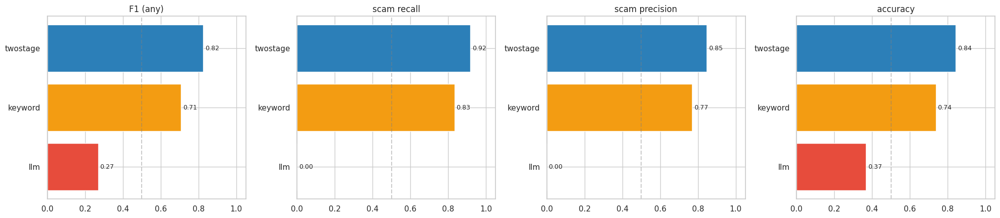

In [15]:
# === f1_any = macro F1 ภายใต้ any aggregation (เหมือน experiment2_2) ===
rows = []
for s, wdf in results.items():
    calls = [{'true': int(g.true_label.iloc[0]),
              'pred': int((g.prob_scam > SCAM_THRESHOLD).any())}
             for _, g in wdf.groupby('filename')]
    cdf = pd.DataFrame(calls)
    y, p = cdf.true.values, cdf.pred.values
    rows.append({
        'system':       s,
        'f1_any':       f1_score(y, p, average='macro', zero_division=0),   # ⭐ ตัวหลัก
        'scam_recall':  recall_score(y, p, pos_label=1, zero_division=0),
        'scam_prec':    precision_score(y, p, pos_label=1, zero_division=0),
        'accuracy':     accuracy_score(y, p),
        # คงไว้ดูเพิ่ม
        'scam_f1':      f1_score(y, p, pos_label=1, zero_division=0),
        'notscam_f1':   f1_score(y, p, pos_label=0, zero_division=0),
    })
summary = pd.DataFrame(rows).sort_values('f1_any', ascending=False).round(4)
summary.to_csv(f'{OUT_DIR}/summary.csv', index=False)
print('=== 3 Systems (f1_any = macro F1 @ any aggregation) ===')
display(summary)

# Plot ใช้ f1_any เป็นหลัก
fig, axes = plt.subplots(1, 4, figsize=(20, 4.5))
type_color = {'llm':'#e74c3c','keyword':'#f39c12','twostage':'#2c7fb8'}
panels = [('f1_any','F1 (any)'), ('scam_recall','scam recall'),
          ('scam_prec','scam precision'), ('accuracy','accuracy')]
for ax, (col, title) in zip(axes, panels):
    sub = summary.sort_values(col)
    ax.barh(sub.system, sub[col], color=[type_color[s] for s in sub.system])
    ax.set_title(title); ax.set_xlim(0, 1.05)
    ax.axvline(0.5, color='gray', ls='--', alpha=0.4)
    for i, v in enumerate(sub[col]):
        ax.text(v + 0.01, i, f'{v:.2f}', va='center', fontsize=9)
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/baseline_metrics.png', dpi=150, bbox_inches='tight')
plt.show()

=== test sliding llm (rw_scam05.mp3, ~4 windows) ===
 round  start_sec  end_sec  prob_scam  latency
     1        0.0      5.0        1.0 1.731685
     2        0.0     10.0        1.0 1.782842
     3        0.0     15.0        0.9 1.848195
  ถ้า prob ดูสมเหตุสมผล (scam ควรสูง) → รันต่อด้านล่าง
  ถ้า prob = 0 หมด → หยุดก่อน เช็ก error



llm-sliding:   0%|          | 0/19 [00:00<?, ?it/s]


✅ llm latency mean = 2.14 sec/round
   total rounds: 453


,system,f1_any,scam_recall,scam_prec,accuracy,lat_per_round
1,twostage,0.8246,0.9167,0.8462,0.8421,1.1678
2,keyword,0.7077,0.8333,0.7692,0.7368,1.1545
0,llm,0.3871,1.0000,0.6316,0.6316,2.1441


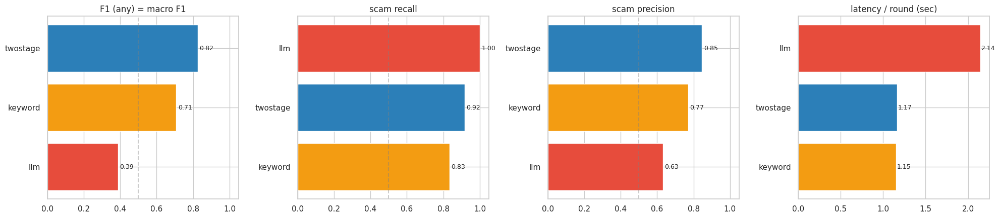

In [17]:
# === Re-run LLM sliding 0-5, 0-10, 0-15, 5-20, ... (1 call/window) ===
import io, base64, soundfile as sf
from concurrent.futures import ThreadPoolExecutor

OPENROUTER_MODEL = 'google/gemini-2.5-flash'
gpt = OpenAI(api_key=userdata.get('OPENROUTER_KEY'),
             base_url='https://openrouter.ai/api/v1')

def _audio_to_b64_wav(wav, sr=SR):
    if wav.dtype != np.int16:
        wav = (np.clip(wav, -1, 1) * 32767).astype(np.int16)
    buf = io.BytesIO()
    sf.write(buf, wav, sr, format='WAV', subtype='PCM_16')
    return base64.b64encode(buf.getvalue()).decode('utf-8')

def llm_audio_prob_wav(wav, sr=SR):
    if len(wav) == 0: return 0.0
    b64 = _audio_to_b64_wav(wav, sr)
    try:
        r = gpt.chat.completions.create(
            model=OPENROUTER_MODEL,
            messages=[
                {'role':'system','content': ZERO_SHOT_SYSTEM},
                {'role':'user','content':[
                    {'type':'text','text':'ฟังคลิปนี้ ความน่าจะเป็น scam (0-100):'},
                    {'type':'input_audio','input_audio':{'data': b64,'format':'wav'}},
                ]},
            ],
            temperature=0, max_tokens=5,
        )
        num = re.findall(r'\d+', r.choices[0].message.content)
        return float(num[0])/100 if num else 0.0
    except Exception as e:
        print('llm err:', str(e)[:120]); return 0.0

# Sliding runner สำหรับ LLM — รัน window พร้อมกัน 10 ตัวต่อไฟล์
def run_sliding_llm(audio_path, chunk_sec=CHUNK_SEC, max_ctx=MAX_CONTEXT_SEC, workers=10):
    wav,_ = librosa.load(audio_path, sr=SR); dur = len(wav)/SR
    windows = []
    for i, end in enumerate(np.arange(chunk_sec, dur+0.1, chunk_sec)):
        start = 0 if end <= max_ctx else end - max_ctx
        windows.append((i+1, float(start), float(end),
                        wav[int(start*SR):int(end*SR)]))

    def _do(w):
        i, s, e, audio = w
        t0 = time.time()
        prob = llm_audio_prob_wav(audio, SR)
        return {'round':i,'start_sec':s,'end_sec':e,
                'prob_scam':float(prob),'pred':int(prob>SCAM_THRESHOLD),
                'latency':time.time()-t0,'transcript':''}

    with ThreadPoolExecutor(max_workers=workers) as ex:
        rows = list(ex.map(_do, windows))
    return pd.DataFrame(sorted(rows, key=lambda r: r['round']))

# 🧪 Test 1 ไฟล์เล็กก่อน
_p = f'{REAL_AUDIO_DIR}/rw_scam05.mp3'   # ไฟล์สั้นสุด 20s = แค่ 4 windows
print('=== test sliding llm (rw_scam05.mp3, ~4 windows) ===')
_df = run_sliding_llm(_p)
print(_df[['round','start_sec','end_sec','prob_scam','latency']].to_string(index=False))
print('  ถ้า prob ดูสมเหตุสมผล (scam ควรสูง) → รันต่อด้านล่าง')
print('  ถ้า prob = 0 หมด → หยุดก่อน เช็ก error\n')

# 🚀 รัน LLM ทุกไฟล์
rows = []
for _, m in tqdm(meta.iterrows(), total=len(meta), desc='llm-sliding'):
    df = run_sliding_llm(f'{REAL_AUDIO_DIR}/{m.filename}')
    df['filename'] = m.filename; df['true_label'] = m.label
    rows.append(df)
results['llm'] = pd.concat(rows, ignore_index=True)
results['llm'].to_csv(f'{OUT_DIR}/llm_rounds.csv', index=False)
print(f'\n✅ llm latency mean = {results["llm"].latency.mean():.2f} sec/round')
print(f'   total rounds: {len(results["llm"])}')

# คำนวณ + plot ใหม่ (any aggregation เหมือนตัว twostage/keyword)
rows = []
for s, wdf in results.items():
    calls = [{'true':int(g.true_label.iloc[0]),
              'pred':int((g.prob_scam>SCAM_THRESHOLD).any())}
             for _,g in wdf.groupby('filename')]
    cdf = pd.DataFrame(calls); y,p = cdf.true.values, cdf.pred.values
    rows.append({
        'system':s,
        'f1_any':      f1_score(y,p,average='macro',zero_division=0),
        'scam_recall': recall_score(y,p,pos_label=1,zero_division=0),
        'scam_prec':   precision_score(y,p,pos_label=1,zero_division=0),
        'accuracy':    accuracy_score(y,p),
        'lat_per_round': wdf.latency.mean(),
    })
summary = pd.DataFrame(rows).sort_values('f1_any', ascending=False).round(4)
summary.to_csv(f'{OUT_DIR}/summary.csv', index=False); display(summary)

fig, axes = plt.subplots(1,4,figsize=(20,4.5))
type_color = {'llm':'#e74c3c','keyword':'#f39c12','twostage':'#2c7fb8'}
for ax,(col,t) in zip(axes,[('f1_any','F1 (any) = macro F1'),('scam_recall','scam recall'),
                            ('scam_prec','scam precision'),('lat_per_round','latency / round (sec)')]):
    sub = summary.sort_values(col)
    ax.barh(sub.system, sub[col], color=[type_color[s] for s in sub.system])
    ax.set_title(t)
    if col!='lat_per_round':
        ax.set_xlim(0,1.05); ax.axvline(0.5,color='gray',ls='--',alpha=0.4)
    for i,v in enumerate(sub[col]): ax.text(v+0.01,i,f'{v:.2f}',va='center',fontsize=9)
plt.tight_layout(); plt.savefig(f'{OUT_DIR}/baseline_metrics.png',dpi=150,bbox_inches='tight'); plt.show()

=== 3 Systems (any aggregation) ===


,system,f1_any,scam_f1,notscam_f1,weighted_f1,scam_recall,scam_prec,accuracy,lat_per_round
1,twostage,0.8246,0.8800,0.7692,0.8392,0.9167,0.8462,0.8421,1.1678
2,keyword,0.7077,0.8000,0.6154,0.7320,0.8333,0.7692,0.7368,1.1545
0,llm,0.3871,0.7742,0.0000,0.4890,1.0000,0.6316,0.6316,2.1441


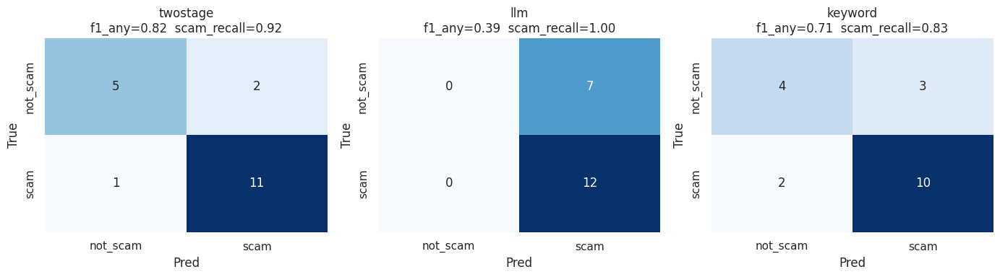

In [20]:
# === Metrics + Plot (any aggregation) ===
rows = []
for s, wdf in results.items():
    calls = [{'true':int(g.true_label.iloc[0]),
              'pred':int((g.prob_scam>SCAM_THRESHOLD).any())}
             for _,g in wdf.groupby('filename')]
    cdf = pd.DataFrame(calls); y, p = cdf.true.values, cdf.pred.values
    rows.append({
        'system':        s,
        'f1_any':        f1_score(y, p, average='macro', zero_division=0),
        'scam_f1':       f1_score(y, p, pos_label=1, zero_division=0),
        'notscam_f1':    f1_score(y, p, pos_label=0, zero_division=0),
        'weighted_f1':   f1_score(y, p, average='weighted', zero_division=0),
        'scam_recall':   recall_score(y, p, pos_label=1, zero_division=0),
        'scam_prec':     precision_score(y, p, pos_label=1, zero_division=0),
        'accuracy':      accuracy_score(y, p),
        'lat_per_round': wdf.latency.mean(),
    })
summary = pd.DataFrame(rows).sort_values('f1_any', ascending=False).round(4)
summary.to_csv(f'{OUT_DIR}/summary.csv', index=False)
print('=== 3 Systems (any aggregation) ===')
display(summary)


# --- Confusion matrix ---
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for ax, s in zip(axes, ['twostage','llm','keyword']):
    if s not in results: continue
    wdf = results[s]
    calls = [{'true':int(g.true_label.iloc[0]),
              'pred':int((g.prob_scam>SCAM_THRESHOLD).any())}
             for _,g in wdf.groupby('filename')]
    cdf = pd.DataFrame(calls)
    cm = confusion_matrix(cdf.true, cdf.pred, labels=[0,1])
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
    row = summary[summary.system==s].iloc[0]
    ax.set_title(f'{s}\nf1_any={row.f1_any:.2f}  scam_recall={row.scam_recall:.2f}')
    ax.set_xlabel('Pred'); ax.set_ylabel('True')
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/baseline_confusion.png', dpi=150, bbox_inches='tight')
plt.show()